# Sondage sur photos d'annonces réelles — le recadrage change-t-il quelque chose ?

Le modèle de la phase 1 atteint **macro-F1 = 0,815 sur CarDD**, qui est fait de **gros plans** où
le dégât occupe 30 à 80 % du cadre. Une photo d'annonce est prise à trois mètres : une bosse d'aile
y occupe ~2 % du cadre, et après redimensionnement à 224 px elle mesure une dizaine de pixels.

Ce carnet ne mesure pas la performance réelle, il **teste une hypothèse d'échelle** en comparant
trois façons de présenter la même photo au modèle :

| variante | ce qu'elle fait | ce qu'elle teste |
|---|---|---|
| **A. photo entière** | redimensionnement direct à 224 px | l'usage naïf, la référence négative |
| **B. détourage véhicule** | `detect.py` (Faster R-CNN COCO) trouve la voiture, on recadre avec 5 % de marge, puis 224 px | récupérer les pixels perdus dans le ciel et le gravier |
| **C. tuiles sur le détourage** | le détourage est découpé en fenêtres glissantes de 224 et 448 px, chaque tuile passe dans le modèle, on garde le **maximum** par classe | attaquer directement l'écart d'échelle |

## Limites de méthode, posées avant de regarder les résultats

- **Aucune vérité terrain.** Les photos n'ont pas d'annotation par dégât visible : on lit les
  probabilités à l'œil. Donc **aucun chiffre de ce carnet n'est une performance** et rien d'ici ne
  se compare au 0,815 de CarDD.
- **Biais de sélection assumé.** Les photos ont été choisies à la main, pas tirées au hasard : le
  sondage montre ce que le modèle fait sur des cas choisis, pas sur le flux réel des annonces.
- **Échantillon minuscule** (une dizaine de photos). On cherche un effet **franc** — du type « le
  modèle ne voit rien en A et voit en C ». Un écart faible ne serait pas interprétable.
- Le seuil 0,5 de la phase 1 est indicatif ici : il a été fixé sur des gros plans CarDD.

In [1]:
import sys
sys.path.insert(0, "../../src")

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

from device import get_device
from infer import load_model, predict
from detect import load_detector, detecter, recadrer
from localize import tile_max_probs

device = get_device()
modele, CLASSES, device = load_model("../../models/cardd_baseline.pt", device)
print("device :", device, "| classes :", CLASSES)

DOSSIER = Path("../../data/real_test/raw")
photos = sorted(p for p in DOSSIER.iterdir() if p.suffix.lower() in {".jpg", ".jpeg", ".png"})
print(f"\n{len(photos)} photos :")
for p in photos:
    print(" ", p.name, Image.open(p).size)

device : mps | classes : ['dent', 'scratch', 'crack', 'glass shatter', 'lamp broken', 'tire flat']

13 photos :
  01_intact.jpg (800, 600)
  02_dent.jpg (1000, 750)
  03_scratch.jpg (1000, 823)
  04_306_flanc_rayure_bosse.png (938, 616)
  05_corsa_bosse_aile_avant.png (496, 358)
  06_207_aile_enfoncee.png (512, 644)
  07_santafe_parechoc_arriere_enfonce.png (456, 386)
  08_fiesta_parechoc_avant_raye.png (900, 652)
  09_laguna_choc_frontal.png (1154, 770)
  10_polo_avant_mouille.png (1058, 634)
  11_rouge_parechoc_troue_feu_fissure.png (928, 760)
  12_intact_porsche944.png (1034, 528)
  13_intact_jaguar.png (1422, 766)


## Variante A — photo entière

Le pire cas, et pourtant l'usage le plus naturel : on donne la photo telle quelle. À lire : les
probabilités sont-elles **basses et plates** (le modèle ne voit rien) ou déjà informatives ?

In [2]:
def ligne_probas(nom, variante, probas):
    ordre = sorted(probas.items(), key=lambda kv: -kv[1])
    return {"photo": nom, "variante": variante,
            "classe #1": ordre[0][0], "proba #1": round(ordre[0][1], 3),
            "classe #2": ordre[1][0], "proba #2": round(ordre[1][1], 3),
            "max": round(max(probas.values()), 3),
            "n > 0,5": sum(v > 0.5 for v in probas.values())}

images = {p.name: Image.open(p).convert("RGB") for p in photos}
probas_A = {n: predict(modele, CLASSES, device, im) for n, im in images.items()}

table_A = pd.DataFrame([ligne_probas(n, "A entière", pr) for n, pr in probas_A.items()])
display(pd.DataFrame(probas_A).T.round(3))
table_A

,dent,scratch,crack,glass shatter,lamp broken,tire flat
01_intact.jpg,0.946,0.032,0.031,0.380,0.588,0.069
02_dent.jpg,1.000,0.660,0.101,0.099,0.029,0.003
03_scratch.jpg,0.650,0.008,0.067,0.729,0.034,0.015
04_306_flanc_rayure_bosse.png,0.683,0.910,0.073,0.014,0.001,0.015
05_corsa_bosse_aile_avant.png,0.433,0.999,0.001,0.001,0.018,0.003
06_207_aile_enfoncee.png,0.967,0.626,0.074,0.004,0.015,0.005
07_santafe_parechoc_arriere_enfonce.png,0.946,0.852,0.342,0.001,0.042,0.021
08_fiesta_parechoc_avant_raye.png,0.907,0.975,0.011,0.003,0.004,0.006
09_laguna_choc_frontal.png,0.435,0.988,0.969,0.009,0.731,0.007
10_polo_avant_mouille.png,0.306,0.054,0.333,0.010,0.022,0.014


,photo,variante,classe #1,proba #1,classe #2,proba #2,max,"n > 0,5"
0,01_intact.jpg,A entière,dent,0.946,lamp broken,0.588,0.946,2
1,02_dent.jpg,A entière,dent,1.000,scratch,0.660,1.000,2
2,03_scratch.jpg,A entière,glass shatter,0.729,dent,0.650,0.729,2
3,04_306_flanc_rayure_bosse.png,A entière,scratch,0.910,dent,0.683,0.910,2
4,05_corsa_bosse_aile_avant.png,A entière,scratch,0.999,dent,0.433,0.999,1
5,06_207_aile_enfoncee.png,A entière,dent,0.967,scratch,0.626,0.967,2
6,07_santafe_parechoc_arriere_enfonce.png,A entière,dent,0.946,scratch,0.852,0.946,2
7,08_fiesta_parechoc_avant_raye.png,A entière,scratch,0.975,dent,0.907,0.975,2
8,09_laguna_choc_frontal.png,A entière,scratch,0.988,crack,0.969,0.988,3
9,10_polo_avant_mouille.png,A entière,crack,0.333,dent,0.306,0.333,0


## Variante B — détourage du véhicule

`detect.py` en inférence pure (Faster R-CNN pré-entraîné COCO, aucun ré-entraînement). On garde la
**plus grande** boîte de type véhicule : sur une annonce, la voiture vendue est au premier plan.

`fraction_cadre` dit quelle part de la photo le véhicule occupe — c'est la mesure de ce que le
détourage récupère. Une absence de détection est elle aussi une information : un habitacle, un
document ou une pièce détachée ne déclenchent pas un détecteur de véhicules.

In [3]:
detecteur, categories = load_detector(device)
det = detecter(detecteur, categories, device, [str(p) for p in photos], score_min=0.5)

recadrees, infos = {}, []
for p, d in zip(photos, det):
    im = images[p.name]
    ok = d["boite"] is not None
    recadrees[p.name] = recadrer(im, d["boite"]) if ok else im
    infos.append({"photo": p.name, "véhicule détecté": ok,
                  "classe COCO": d["classe"], "score": round(d["score"], 3) if ok else None,
                  "fraction du cadre": round(d["fraction_cadre"], 3) if ok else None,
                  "taille recadrée": recadrees[p.name].size})
display(pd.DataFrame(infos))

probas_B = {n: predict(modele, CLASSES, device, im) for n, im in recadrees.items()}
pd.DataFrame(probas_B).T.round(3)

,photo,véhicule détecté,classe COCO,score,fraction du cadre,taille recadrée
0,01_intact.jpg,True,car,0.999,0.543,"(735, 428)"
1,02_dent.jpg,True,car,0.983,0.812,"(1000, 671)"
2,03_scratch.jpg,True,car,0.945,0.869,"(1000, 790)"
3,04_306_flanc_rayure_bosse.png,True,car,0.824,0.719,"(710, 616)"
4,05_corsa_bosse_aile_avant.png,True,car,0.768,0.978,"(496, 358)"
5,06_207_aile_enfoncee.png,True,car,0.907,0.976,"(512, 644)"
6,07_santafe_parechoc_arriere_enfonce.png,True,car,0.702,0.832,"(456, 344)"
7,08_fiesta_parechoc_avant_raye.png,True,car,0.995,0.891,"(900, 618)"
8,09_laguna_choc_frontal.png,True,car,0.968,0.846,"(1127, 735)"
9,10_polo_avant_mouille.png,True,car,0.987,0.803,"(1004, 619)"


,dent,scratch,crack,glass shatter,lamp broken,tire flat
01_intact.jpg,0.992,0.214,0.014,0.259,0.163,0.014
02_dent.jpg,0.998,0.872,0.074,0.080,0.029,0.007
03_scratch.jpg,0.600,0.009,0.046,0.805,0.017,0.017
04_306_flanc_rayure_bosse.png,0.699,0.879,0.284,0.006,0.002,0.019
05_corsa_bosse_aile_avant.png,0.433,0.999,0.001,0.001,0.018,0.003
06_207_aile_enfoncee.png,0.967,0.626,0.074,0.004,0.015,0.005
07_santafe_parechoc_arriere_enfonce.png,0.834,0.854,0.370,0.002,0.042,0.019
08_fiesta_parechoc_avant_raye.png,0.912,0.981,0.013,0.003,0.009,0.004
09_laguna_choc_frontal.png,0.574,0.981,0.992,0.009,0.752,0.008
10_polo_avant_mouille.png,0.199,0.053,0.449,0.022,0.027,0.013


## Variante C — tuiles sur le détourage

Fenêtres glissantes de 224 et 448 px avec 50 % de chevauchement, sur l'image **détourée**. Chaque
tuile est un « gros plan » artificiel, donc plus proche de la distribution d'entraînement CarDD. On
retient le **maximum** par classe, plus la tuile qui l'a déclenché — ce qui donne gratuitement une
localisation grossière.

Attention à un effet pervers attendu : plus on tire de tuiles, plus la probabilité qu'une d'elles
déclenche par hasard augmente. Une hausse du maximum peut donc être un vrai gain d'échelle **ou**
une inflation de fausses alertes. Les photos intactes du lot servent précisément à trancher.

In [4]:
probas_C, boites_C = {}, {}
for n, im in recadrees.items():
    probas_C[n], boites_C[n] = tile_max_probs(modele, CLASSES, device, im,
                                              tile_sizes=(224, 448), overlap=0.5)
    n_tuiles = None
print("nombre de tuiles par photo : dépend de la taille du détourage (224 et 448 px, 50 % de chevauchement)")
pd.DataFrame(probas_C).T.round(3)

nombre de tuiles par photo : dépend de la taille du détourage (224 et 448 px, 50 % de chevauchement)


,dent,scratch,crack,glass shatter,lamp broken,tire flat
01_intact.jpg,0.963,0.955,0.908,0.955,0.846,0.961
02_dent.jpg,0.999,0.884,0.994,0.945,0.992,0.940
03_scratch.jpg,0.993,0.997,0.177,1.000,0.171,0.150
04_306_flanc_rayure_bosse.png,0.212,0.999,0.213,0.055,0.144,0.445
05_corsa_bosse_aile_avant.png,0.470,1.000,0.142,0.034,0.163,0.489
06_207_aile_enfoncee.png,0.979,0.983,0.187,0.232,0.067,0.414
07_santafe_parechoc_arriere_enfonce.png,0.906,0.986,0.368,0.009,0.041,0.501
08_fiesta_parechoc_avant_raye.png,0.606,1.000,0.113,0.284,0.079,0.138
09_laguna_choc_frontal.png,0.560,0.997,0.997,0.221,0.939,0.077
10_polo_avant_mouille.png,0.873,0.996,0.710,0.345,0.945,0.119


## Le tableau qui tranche

Pour chaque photo, le maximum de probabilité et la classe dominante dans les trois variantes.
La colonne `max` est celle à lire : c'est « le modèle voit-il quelque chose ? ».

In [5]:
comparatif = pd.concat([
    pd.DataFrame([ligne_probas(n, "A entière", p) for n, p in probas_A.items()]),
    pd.DataFrame([ligne_probas(n, "B détourée", p) for n, p in probas_B.items()]),
    pd.DataFrame([ligne_probas(n, "C tuiles", p) for n, p in probas_C.items()]),
]).set_index(["photo", "variante"]).sort_index()
display(comparatif)

pivot = comparatif.reset_index().pivot(index="photo", columns="variante", values="max")
pivot["gain B-A"] = (pivot["B détourée"] - pivot["A entière"]).round(3)
pivot["gain C-A"] = (pivot["C tuiles"] - pivot["A entière"]).round(3)
display(pivot)
print("\nmédiane du maximum par variante :")
print(pivot[["A entière", "B détourée", "C tuiles"]].median().round(3))

classe #1  proba #1  \
photo                                   variante                              
01_intact.jpg                           A entière            dent     0.946   
                                        B détourée           dent     0.992   
                                        C tuiles             dent     0.963   
02_dent.jpg                             A entière            dent     1.000   
                                        B détourée           dent     0.998   
                                        C tuiles             dent     0.999   
03_scratch.jpg                          A entière   glass shatter     0.729   
                                        B détourée  glass shatter     0.805   
                                        C tuiles    glass shatter     1.000   
04_306_flanc_rayure_bosse.png           A entière         scratch     0.910   
                                        B détourée        scratch     0.879   
                                        C tuiles          scratch     0.999   
05_corsa_bosse_aile_avant.png           A entière         scratch     0.999   
                                        B détourée        scratch     0.999   
                                        C tuiles          scratch     1.000   
06_207_aile_enfoncee.png                A entière            dent     0.967   
                                        B détourée           dent     0.967   
                                        C tuiles          scratch     0.983   
07_santafe_parechoc_arriere_enfonce.png A entière            dent     0.946   
                                        B détourée        scratch     0.854   
                                        C tuiles          scratch     0.986   
08_fiesta_parechoc_avant_raye.png       A entière         scratch     0.975   
                                        B détourée        scratch     0.981   
                                        C tuiles          scratch     1.000   
09_laguna_choc_frontal.png              A entière         scratch     0.988   
                                        B détourée          crack     0.992   
                                        C tuiles          scratch     0.997   
10_polo_avant_mouille.png               A entière           crack     0.333   
                                        B détourée          crack     0.449   
                                        C tuiles          scratch     0.996   
11_rouge_parechoc_troue_feu_fissure.png A entière           crack     0.800   
                                        B détourée          crack     0.739   
                                        C tuiles          scratch     0.978   
12_intact_porsche944.png                A entière       tire flat     0.612   
                                        B détourée      tire flat     0.612   
                                        C tuiles          scratch     0.991   
13_intact_jaguar.png                    A entière            dent     0.688   
                                        B détourée           dent     0.538   
                                        C tuiles             dent     0.992   

                                                        classe #2  proba #2  \
photo                                   variante                              
01_intact.jpg                           A entière     lamp broken     0.588   
                                        B détourée  glass shatter     0.259   
                                        C tuiles        tire flat     0.961   
02_dent.jpg                             A entière         scratch     0.660   
                                        B détourée        scratch     0.872   
                                        C tuiles            crack     0.994   
03_scratch.jpg                          A entière            dent     0.650   
                                        B détourée           dent     0.600   
                          

variante,A entière,B détourée,C tuiles,gain B-A,gain C-A
photo,,,,,
01_intact.jpg,0.946,0.992,0.963,0.046,0.017
02_dent.jpg,1.000,0.998,0.999,-0.002,-0.001
03_scratch.jpg,0.729,0.805,1.000,0.076,0.271
04_306_flanc_rayure_bosse.png,0.910,0.879,0.999,-0.031,0.089
05_corsa_bosse_aile_avant.png,0.999,0.999,1.000,0.000,0.001
06_207_aile_enfoncee.png,0.967,0.967,0.983,0.000,0.016
07_santafe_parechoc_arriere_enfonce.png,0.946,0.854,0.986,-0.092,0.040
08_fiesta_parechoc_avant_raye.png,0.975,0.981,1.000,0.006,0.025
09_laguna_choc_frontal.png,0.988,0.992,0.997,0.004,0.009



médiane du maximum par variante :
variante
A entière     0.946
B détourée    0.879
C tuiles      0.996
dtype: float64


## Lecture visuelle

Une ligne par photo : la photo entière avec la boîte véhicule, le détourage, et la tuile qui a
déclenché la classe la plus forte de la variante C. Les titres portent les probabilités.

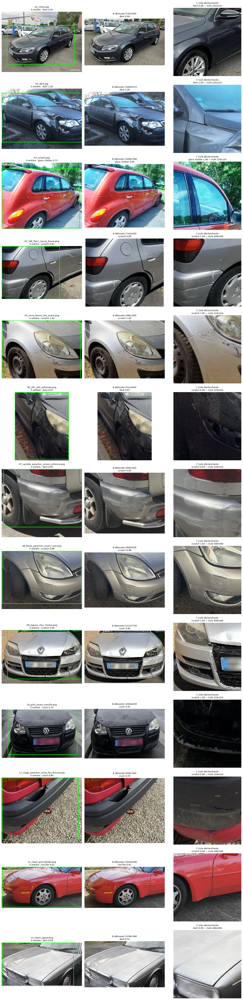

In [6]:
n = len(photos)
fig, axes = plt.subplots(n, 3, figsize=(15, 4.6 * n))
axes = np.atleast_2d(axes)

for i, (p, d) in enumerate(zip(photos, det)):
    nom = p.name
    im, crop = images[nom], recadrees[nom]

    axes[i, 0].imshow(im)
    if d["boite"]:
        x1, y1, x2, y2 = d["boite"]
        axes[i, 0].add_patch(patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                               fill=False, lw=2, color="lime"))
    a = max(probas_A[nom].items(), key=lambda kv: kv[1])
    axes[i, 0].set_title(f"{nom}\nA entière : {a[0]} {a[1]:.2f}", fontsize=9)

    b = max(probas_B[nom].items(), key=lambda kv: kv[1])
    axes[i, 1].imshow(crop)
    axes[i, 1].set_title(f"B détourée ({crop.size[0]}x{crop.size[1]})\n{b[0]} {b[1]:.2f}", fontsize=9)

    c_cls, c_val = max(probas_C[nom].items(), key=lambda kv: kv[1])
    bt = boites_C[nom][c_cls]
    if bt:
        x, y, w, h = bt
        axes[i, 2].imshow(crop.crop((x, y, x + w, y + h)))
        axes[i, 2].set_title(f"C tuile déclenchante\n{c_cls} {c_val:.2f} — tuile {w}x{h}", fontsize=9)
    else:
        axes[i, 2].imshow(crop)
        axes[i, 2].set_title("C : aucune tuile", fontsize=9)

    for j in range(3):
        axes[i, j].axis("off")
plt.tight_layout(); plt.show()

## Conclusion — l'hypothèse testée n'était pas la bonne

### Ce qui a été mesuré

Maximum de probabilité par photo (13 photos, dont **3 voitures intactes**) :

| photo | A entière | B détourée | C tuiles |
|---|---|---|---|
| **Passat intacte** (annonce complète) | **0,946** `dent` | 0,992 | 0,963 |
| **Porsche 944 intacte** | **0,612** `tire flat` | 0,612 | **0,991** |
| **Jaguar intacte** | **0,688** `dent` | 0,538 | **0,992** |
| Polo noire mouillée (aucun dégât franc) | 0,333 — rien > 0,5 | 0,449 | **0,996** |
| 306 flanc rayé | 0,910 `scratch` | 0,879 | 0,999 |
| Corsa aile avant | 0,999 `scratch` | 0,999 | 1,000 |
| 207 aile enfoncée | 0,967 `dent` | 0,967 | 0,983 |
| Santa Fe pare-chocs arrière | 0,946 `dent` | 0,854 | 0,986 |
| Fiesta pare-chocs rayé | 0,975 `scratch` | 0,981 | 1,000 |
| Laguna choc frontal | 0,988 `scratch` | 0,992 `crack` | 0,997 |
| Rouge pare-chocs troué, feu fissuré | 0,800 `crack` | 0,739 | 0,978 |
| **médiane** | 0,946 | **0,879** | **0,996** |

### 1. L'écart d'échelle n'est pas le goulot d'étranglement

Sur les photos abîmées, la photo entière donne déjà 0,91 à 1,00. Le détourage **fait baisser** la
médiane (0,879 contre 0,946) : le détecteur a trouvé un véhicule sur les 13 photos, avec une
`fraction_cadre` de 0,80 à 0,98 — ces photos sont des plans rapprochés, il n'y a presque aucun pixel
à récupérer. Le recadrage automatique qu'on voulait construire n'a pas de matière ici.

Limite du protocole à assumer : ce lot ne contient qu'**une** photo d'annonce cadrée large (la
Passat, `fraction_cadre` = 0,54). La conclusion « le détourage ne sert à rien » vaut pour des plans
rapprochés, **pas** pour le flux réel des annonces, où le cadrage large est la norme. Ce point reste
ouvert.

### 2. Les tuiles saturent au lieu de détecter

La variante C monte **tout le monde** à 0,98-1,00, intactes comprises : la Porsche intacte passe de
0,612 à 0,991. Deux causes cumulées :

- **hors distribution** — une tuile de 224 px découpée dans un détourage de 1 000 px ne contient
  souvent que de la peinture, une jante ou du bitume. Le réseau n'a jamais vu ça et sort des valeurs
  élevées arbitraires ;
- **comparaisons multiples** — on tire quelques dizaines de tuiles par photo et on garde le maximum.
  Même avec un taux de fausse alerte faible par tuile, le maximum sature.

Une médiane de 0,996 n'est donc pas un succès, c'est un plafond atteint par du bruit.

### 3. Le vrai blocage : le modèle ne peut pas dire « intact »

Les 2 816 images d'entraînement portent **toutes** au moins un dégât. La probabilité a priori d'un
dégât valait 1 pendant tout l'apprentissage : le réseau ne répond pas à « y a-t-il un dégât ? » mais
à « **lequel** des six, sachant qu'il y en a un ». Sur une voiture intacte, il n'a aucune sortie pour
répondre « rien » et choisit le type le moins improbable — `dent` à 0,946 sur une Passat impeccable.

Les distributions se **recouvrent complètement** : intactes de 0,61 à 0,95, abîmées de 0,33 à 1,00.
Conséquence directe et vérifiable : **aucun réglage de seuil ne peut séparer les deux**. La solution
la moins chère est donc écartée sur preuve, pas sur intuition.

C'est exactement la limite que la décision n°1 avait consignée par écrit avant l'entraînement
(« la moitié intact du binaire dérivé n'est pas entraînée, seulement testable »). Elle est ici
démontrée sur photos réelles — ce qui est le résultat utile de ce carnet.

### Ce que ça implique pour la suite

Optimiser les leviers CarDD (résolution, seuils, architecture) améliorerait le classement du **type**
de dégât sur des gros plans. Ça ne rendrait pas le modèle capable de dire « cette voiture est
intacte » — or c'est la première chose qu'un vendeur particulier attend. Il faut des **exemples
négatifs**, c'est-à-dire des photos de véhicules sans dégât, dans le même domaine que la cible.

### Note RGPD

`01_intact.jpg` porte une **plaque d'immatriculation lisible**. Une plaque rattachable à une personne
est une donnée personnelle : à flouter avant tout livrable ou toute diffusion. Deux photos du lot
étaient déjà floutées à la source.

### Limites de ce carnet, à rappeler à chaque citation

- aucune vérité terrain annotée : les verdicts « abîmé / intact » sont le jugement visuel de
  l'utilisateur, aucun chiffre d'ici n'est une performance ;
- 13 photos choisies à la main, donc biais de sélection ;
- 3 intactes seulement — assez pour montrer que le problème existe, pas pour en mesurer l'ampleur.